<a href="https://colab.research.google.com/github/anambibi/CSU-S15-118/blob/master/ExtractBoundingboxes1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

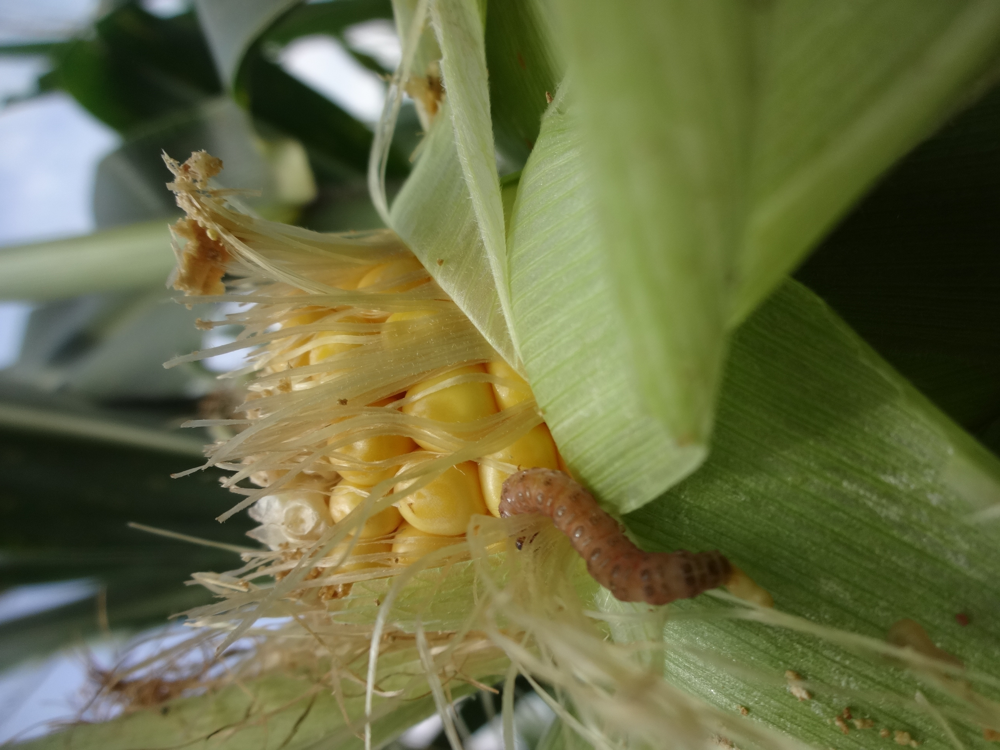

In [6]:
import os
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import torch
import torchvision
import seaborn as sns
import matplotlib.pyplot as plt

from PIL import Image, ImageDraw
import xml.etree.ElementTree as ET
images_dir = '/content/14131_00000139.jpg'
annotations_dir = '/content/boat0.xml'
sample_image = Image.open('/content/14131_00000139.jpg')
sample_image


In [7]:
with open('/content/boat0.xml') as annot_file:
    print(''.join(annot_file.readlines()))


<annotation>
    <folder>images</folder>
    <filename>boat0.png</filename>
    <size>
        <width>2592</width>
        <height>1944</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>14131</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>1270</xmin>
            <ymin>1179</ymin>
            <xmax>1937</xmax>
            <ymax>1579</ymax>
        </bndbox>
    </object>
</annotation>


# New Section

In [8]:
tree = ET.parse('/content/boat0.xml')
root = tree.getroot()

sample_annotations = []

for neighbor in root.iter('bndbox'):
    xmin = int(neighbor.find('xmin').text)
    ymin = int(neighbor.find('ymin').text)
    xmax = int(neighbor.find('xmax').text)
    ymax = int(neighbor.find('ymax').text)
    
#     print(xmin, ymin, xmax, ymax)
    sample_annotations.append([xmin, ymin, xmax, ymax])
    
print(sample_annotations)

[[1270, 1179, 1937, 1579]]


[1270, 1179, 1937, 1579]


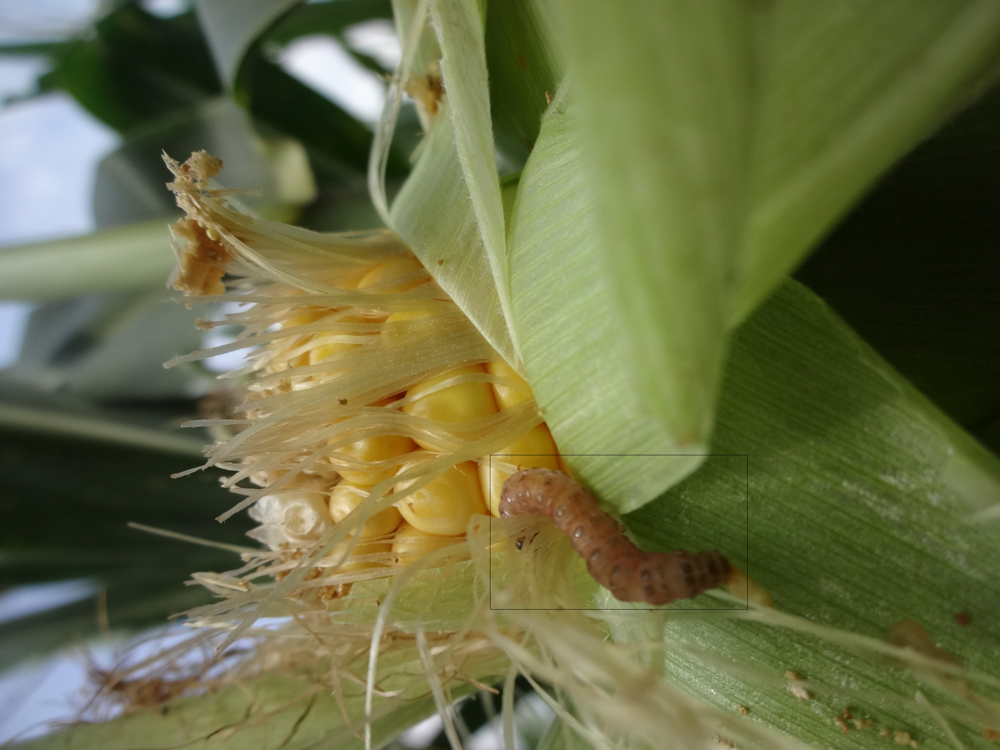

In [10]:
sample_image_annotated = sample_image.copy()

img_bbox = ImageDraw.Draw(sample_image_annotated)

for bbox in sample_annotations:
    print(bbox)
    img_bbox.rectangle(bbox, outline="Black") 
    
sample_image_annotated